In [1]:
import nibabel as nib
import numpy as np
import matplotlib.pylab as plt
import cvxpy as cp
import pandas as pd
from os.path import join
from scipy.spatial.distance import cdist
from scipy.sparse import csgraph
from scipy.stats import skew, kurtosis
from scipy import stats
from itertools import product
from sklearn.model_selection import KFold
from matplotlib.animation import FuncAnimation
from nilearn import masking
from nilearn.image import new_img_like
from nilearn.plotting import plot_stat_map, view_img
import os, sys
from config import Config
from pathlib import Path
from nilearn.image import mean_img
from nilearn.image import resample_to_img
import warnings
from scipy import stats
from statsmodels.stats.multitest import multipletests
from scipy.ndimage import median_filter
from nilearn import plotting, image
import math

In [2]:
def save_beta_html(beta_3d, anat_img, bold_img, A, title, fname):
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message=".*symmetric_cmap=False.*", category=UserWarning)
        warnings.filterwarnings("ignore", message=".*vmin cannot be chosen when cmap is symmetric.*", category=UserWarning)

    finite = np.isfinite(beta_3d)
    beta_filled = np.where(finite, beta_3d, 0.0)
    
    finite = np.isfinite(beta_3d)
    vmax = np.nanpercentile(beta_filled[finite], 99)  
    vmin = np.nanpercentile(beta_filled[finite], 1)
    thr = 1e-6 

    beta_on_anat = nib.Nifti1Image(beta_3d, A, bold_img.header)
    
    view = view_img(beta_on_anat, bg_img=anat_img, cmap='seismic', symmetric_cmap=False, vmax=vmax, vmin=vmin, threshold=thr, 
                    colorbar=True, title=title)
    view.save_as_html(file_name=fname)

In [3]:
ses = 1
sub = '04'
run = 1

base_path = '/mnt/TeamShare/Data_Masterfile/H20-00572_All-Dressed/PRECISIONSTIM_PD_Data_Results/fMRI_preprocessed_data/Rev_pipeline/derivatives'
anat_img = nib.load(f'/mnt/TeamShare/Data_Masterfile/H20-00572_All-Dressed/PRECISIONSTIM_PD_Data_Results/fMRI_preprocessed_data/Rev_pipeline/derivatives/sub-pd0{sub}/ses-{ses}/anat/sub-pd0{sub}_ses-{ses}_T1w_brain.nii.gz')

data_name = f'sub-pd0{sub}_ses-{ses}_run-{run}_task-mv_bold_corrected_smoothed_reg.nii.gz'
BOLD_path_org = join(base_path, f'sub-pd0{sub}', f'ses-{ses}', 'func', data_name)
bold_img = nib.load(BOLD_path_org)
bold_data = bold_img.get_fdata()

mask_path = f'/mnt/TeamShare/Data_Masterfile/H20-00572_All-Dressed/PRECISIONSTIM_PD_Data_Results/fMRI_preprocessed_data/Rev_pipeline/derivatives/sub-pd0{sub}/ses-{ses}/anat/sub-pd0{sub}_ses-{ses}_T1w_brain_mask.nii.gz'
back_mask = nib.load(mask_path)

mask_path = f'/mnt/TeamShare/Data_Masterfile/H20-00572_All-Dressed/PRECISIONSTIM_PD_Data_Results/fMRI_preprocessed_data/Rev_pipeline/derivatives/sub-pd0{sub}/ses-{ses}/anat/sub-pd0{sub}_ses-{ses}_T1w_brain_pve_0.nii.gz'
csf_mask = nib.load(mask_path)

print(anat_img.shape)
print(bold_data.shape)
print(back_mask.shape)
print(csf_mask.shape)

(180, 256, 170)
(180, 256, 170, 850)
(180, 256, 170)
(180, 256, 170)


In [4]:
back_mask_data = back_mask.get_fdata() > 0
csf_mask_data = csf_mask.get_fdata() > 0
mask = np.logical_and(back_mask_data, ~csf_mask_data)
nonzero_mask = np.where(mask)
masked_bold = bold_data[nonzero_mask]

# print('combined mask voxels:', nonzero_mask[0].size)
print(f"number of selected voxels after masking: {masked_bold.shape[0]/math.prod(bold_data.shape[:3])*100:.2f}%")
print('bold_data masked shape:', masked_bold.shape)

number of selected voxels after masking: 13.68%
bold_data masked shape: (1071489, 850)


/home/zkavian/thesis_code_git/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_506466/1533173205.py:9: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  overlay_view = plotting.view_img(overlay_img, bg_img=anat_img, cmap='autumn', symmetric_cmap=False,



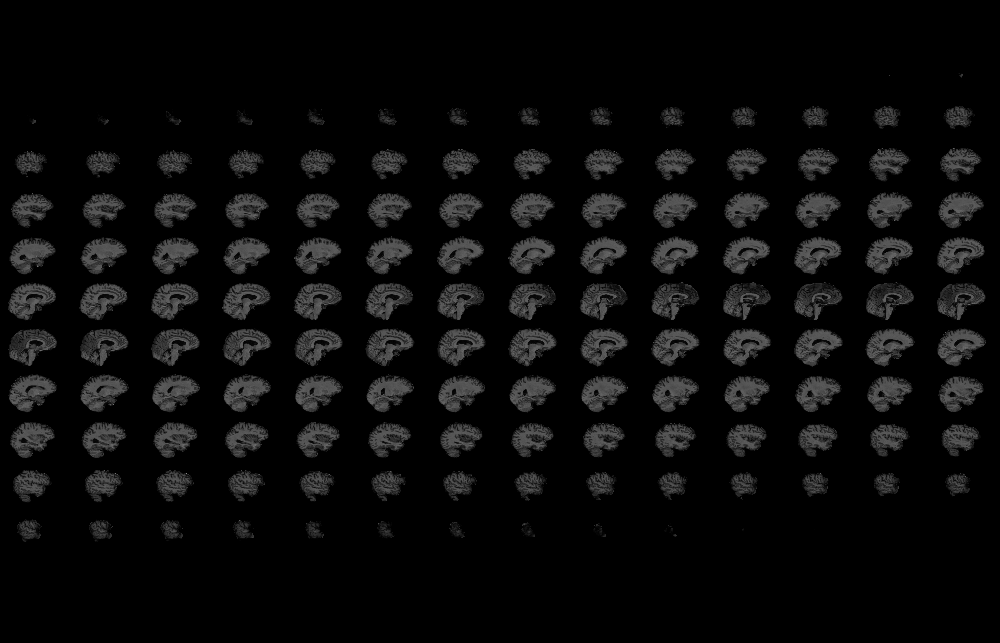
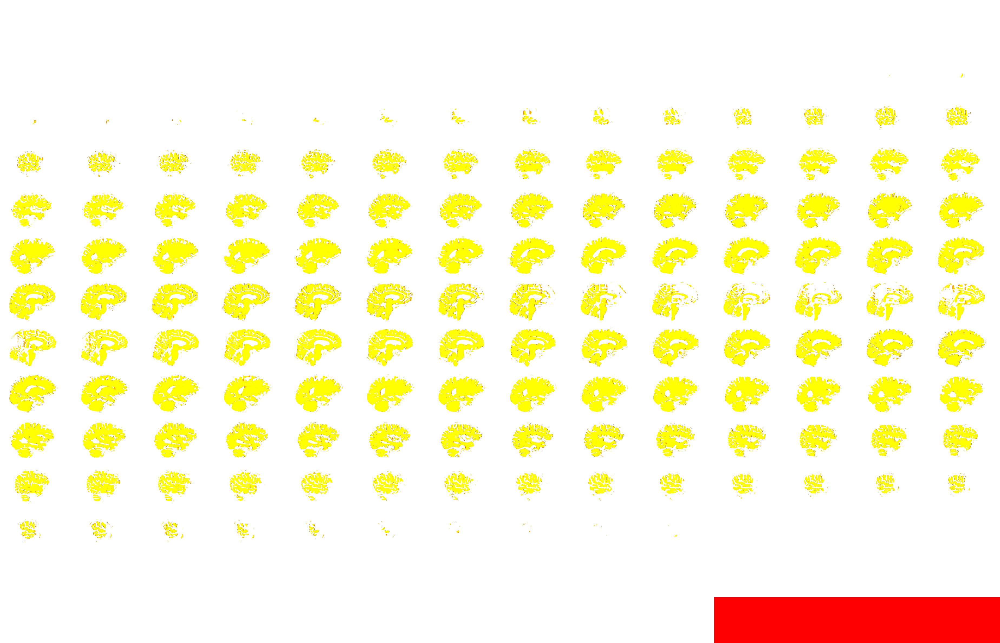

In [5]:
# plot the selected voxels on the anatomical image
voxel_coords = np.column_stack(nonzero_mask)
overlay_data = np.zeros(mask.shape, dtype=np.float32)
overlay_data[tuple(voxel_coords.T)] = 1.0

overlay_img = nib.Nifti1Image(overlay_data, bold_img.affine, bold_img.header)

overlay_view = plotting.view_img(overlay_img, bg_img=anat_img, cmap='autumn', symmetric_cmap=False, 
                                 threshold=0, vmax=1, opacity=0.9, colorbar=False, title='nonzero_mask voxels')

overlay_view

In [5]:
glm_dict = np.load(f'/home/zkavian/thesis_code_git/GLMOutputs-sub{sub}-ses{ses}/TYPED_FITHRF_GLMDENOISE_RR.npy', allow_pickle=True).item()
beta_glm = glm_dict['betasmd']
beta_run1, beta_run2 = beta_glm[:,0,0,:90], beta_glm[:,0,0,90:]
R2_run1, R2_run2 = glm_dict['R2run'][:,:,:,0], glm_dict['R2run'][:,:,:,1]

beta = beta_run1 #beta_glm.shape
R2 = R2_run1

In [10]:
# plot mean beta of voxels with extremly high or low beta value

outlier_volume = np.zeros(bold_data.shape[:3], dtype=np.float32)
beta_mean = np.mean(beta, axis=1)

lowe_thr, high_thr = np.nanpercentile(beta.ravel(), 1), np.nanpercentile(beta.ravel(), 99)
print(f'low_thr: {lowe_thr:.2f}, high_thr: {high_thr:.2f}')
mask = np.logical_or(beta < lowe_thr, beta > high_thr)
# outlier_volume[nonzero_mask] = beta_mean * mask
print(f'number of outlier voxels: {np.sum(mask)}')
mask.shape

low_thr: -4.64, high_thr: 4.60
number of outlier voxels: 1928641


(1071489, 90)

/tmp/ipykernel_614027/2615382318.py:2: RuntimeWarning: Mean of empty slice
  beta_mean = np.nanmean(beta, axis=1)


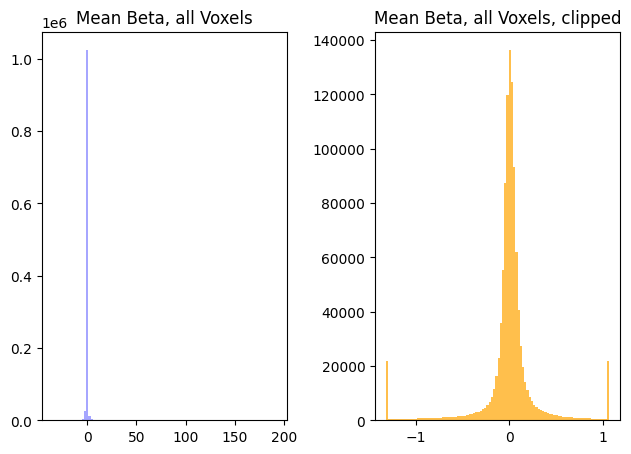

/tmp/ipykernel_614027/2615382318.py:20: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')
/tmp/ipykernel_614027/2615382318.py:20: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')
/tmp/ipykernel_614027/2615382318.py:22: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  outlier_view = plotting.view_img(
/home/zkavian/thesis_code_git/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, 


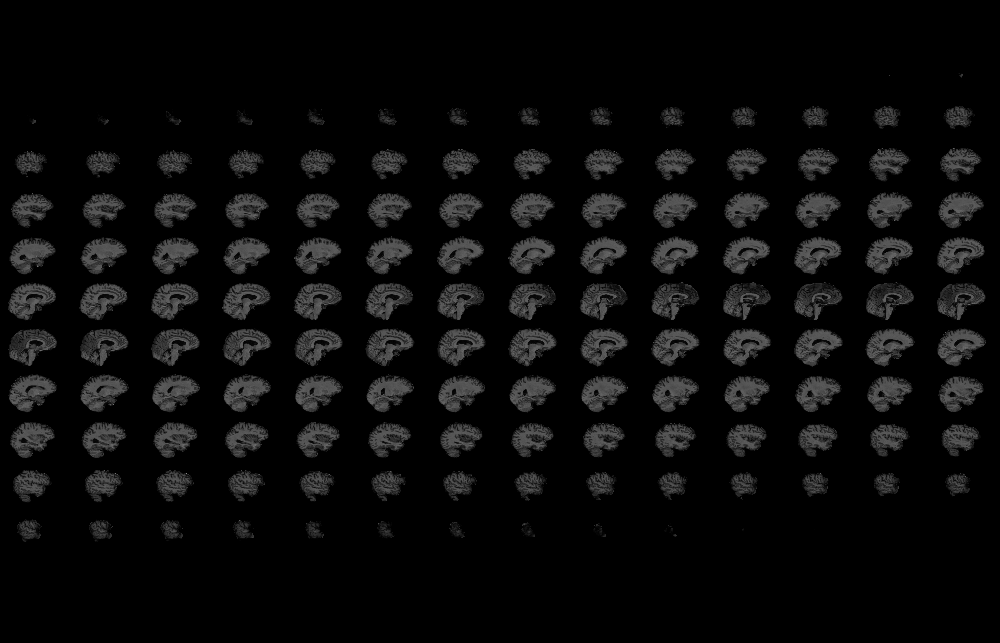
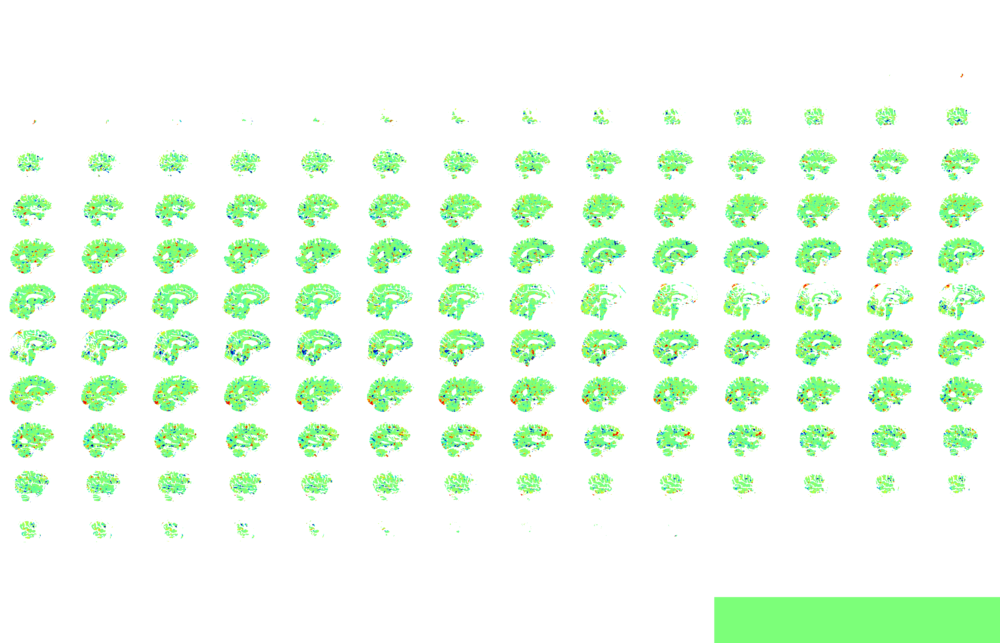

In [11]:
outlier_volume = np.zeros(bold_data.shape[:3], dtype=np.float32)
beta_mean = np.nanmean(beta, axis=1)

# Clip to percentile bounds to suppress extreme outliers for visualization
lower_clip, upper_clip = np.nanpercentile(beta_mean, [2, 98])
beta_mean_clipped = np.clip(beta_mean, lower_clip, upper_clip)

outlier_volume[nonzero_mask] = beta_mean_clipped

fig, axs = plt.subplots(1,2)
axs[0].hist(beta_mean, bins=100, color='blue', alpha=0.35)
axs[0].set_title('Mean Beta, all Voxels')
axs[1].hist(beta_mean_clipped, bins=100, color='orange', alpha=0.7)
axs[1].set_title('Mean Beta, all Voxels, clipped')

plt.tight_layout()
plt.show()

outlier_img = nib.Nifti1Image(outlier_volume, bold_img.affine, bold_img.header)
outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')

outlier_view = plotting.view_img(
    outlier_img,
    bg_img=anat_img,
    cmap='jet',
    opacity=0.8,
    title='Mean Beta of all Voxels (clipped)'
)
outlier_view


Beta values range: [-1986.36, 19687.86]


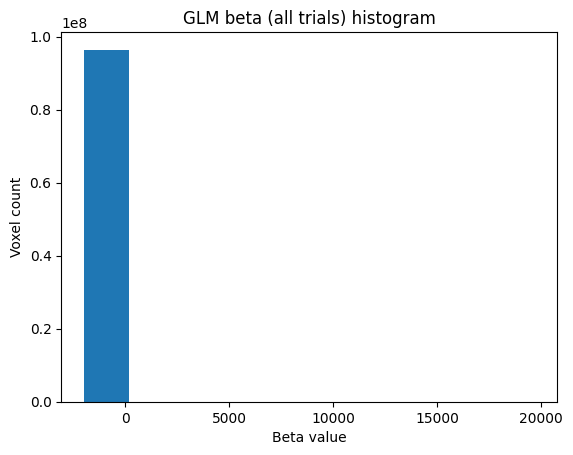

1.01% of voxels are outliers (10875 of 1071489).


/tmp/ipykernel_614027/233587396.py:27: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')
/tmp/ipykernel_614027/233587396.py:27: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')
/home/zkavian/thesis_code_git/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_614027/233587396.py:29: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to 


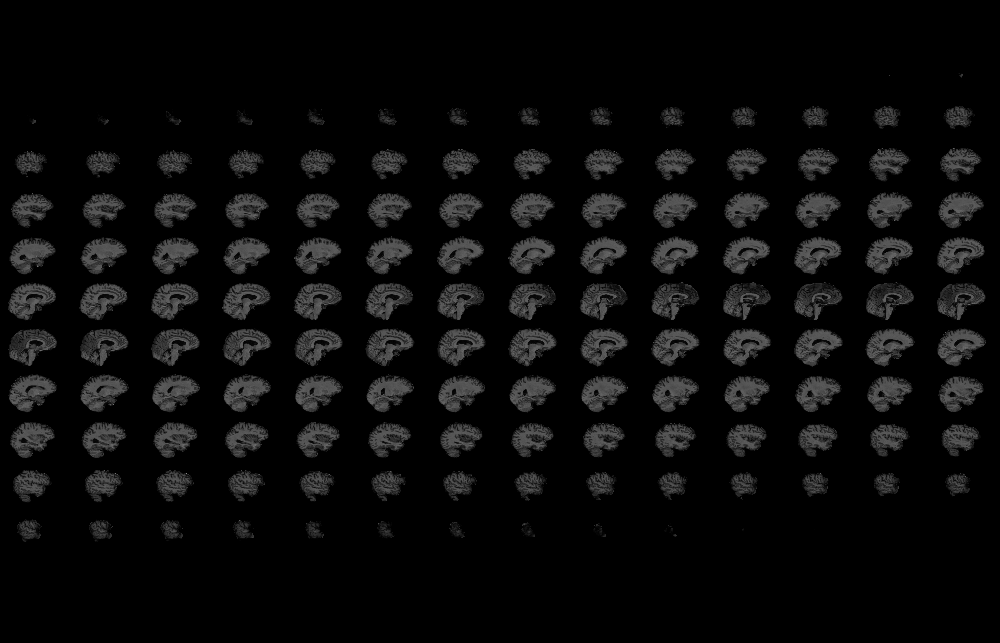
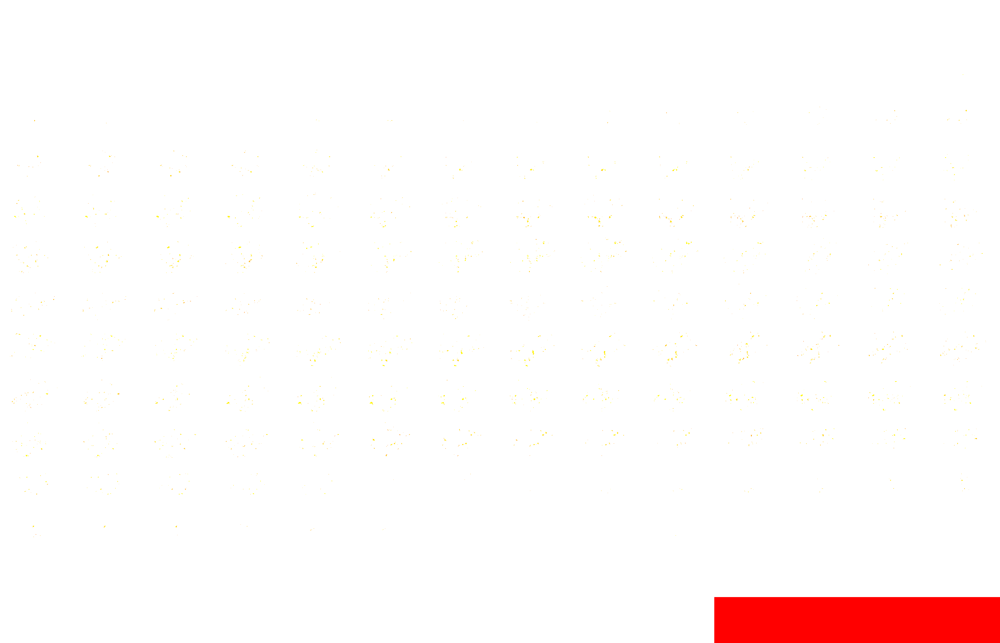

In [12]:
# beta histogram and plot on the brain
outlier_threshold = 200.0

beta_min = np.nanmin(beta)
beta_max = np.nanmax(beta)
print(f"Beta values range: [{beta_min:.2f}, {beta_max:.2f}]")

plt.figure()
plt.hist(beta.flatten())
plt.title('GLM beta (all trials) histogram')
plt.xlabel('Beta value')
plt.ylabel('Voxel count')
plt.show()

outlier_mask = np.abs(beta) > outlier_threshold
outlier_voxel_mask = np.any(outlier_mask, axis=1)
outlier_voxel_coords = np.column_stack(nonzero_mask)[outlier_voxel_mask]

n_outlier_voxels = int(outlier_voxel_mask.sum())
n_total_voxels = beta.shape[0]
print(f"{(n_outlier_voxels / n_total_voxels) * 100:.2f}% of voxels are outliers ({n_outlier_voxels} of {n_total_voxels}).")

outlier_volume = np.zeros(bold_data.shape[:3], dtype=np.float32)
outlier_volume[nonzero_mask] = outlier_voxel_mask.astype(np.float32)

outlier_img = nib.Nifti1Image(outlier_volume, bold_img.affine, bold_img.header)
outlier_img = resample_to_img(outlier_img, anat_img, interpolation='nearest')

outlier_view = plotting.view_img(
    outlier_img,
    bg_img=anat_img,
    cmap='autumn',
    symmetric_cmap=False,
    threshold=0.5,
    vmax=1,
    opacity=0.8,
    title=f'Outlier voxels |beta| > {outlier_threshold:.0f}'
)
outlier_view

# outlier_map_fname = f"outlier_voxels_sub{sub}_ses{ses}_run{run}.html"
# outlier_view.save_as_html(outlier_map_fname)

/tmp/ipykernel_384052/1192719756.py:13: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  beta_img = resample_to_img(beta_img, anat_img, interpolation="linear")
/tmp/ipykernel_384052/1192719756.py:13: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  beta_img = resample_to_img(beta_img, anat_img, interpolation="linear")


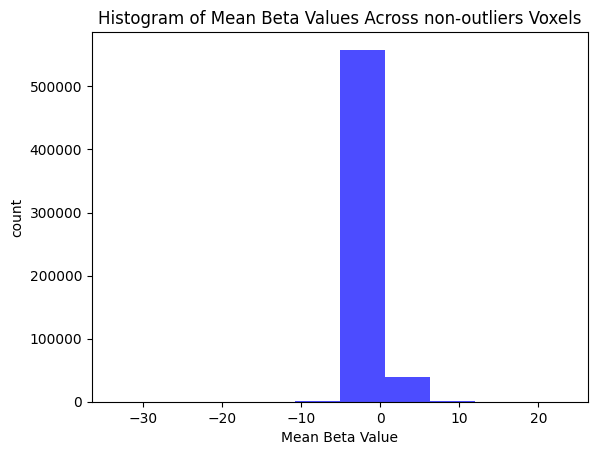

/home/zkavian/thesis_code_git/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_384052/1192719756.py:22: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  view = plotting.view_img(



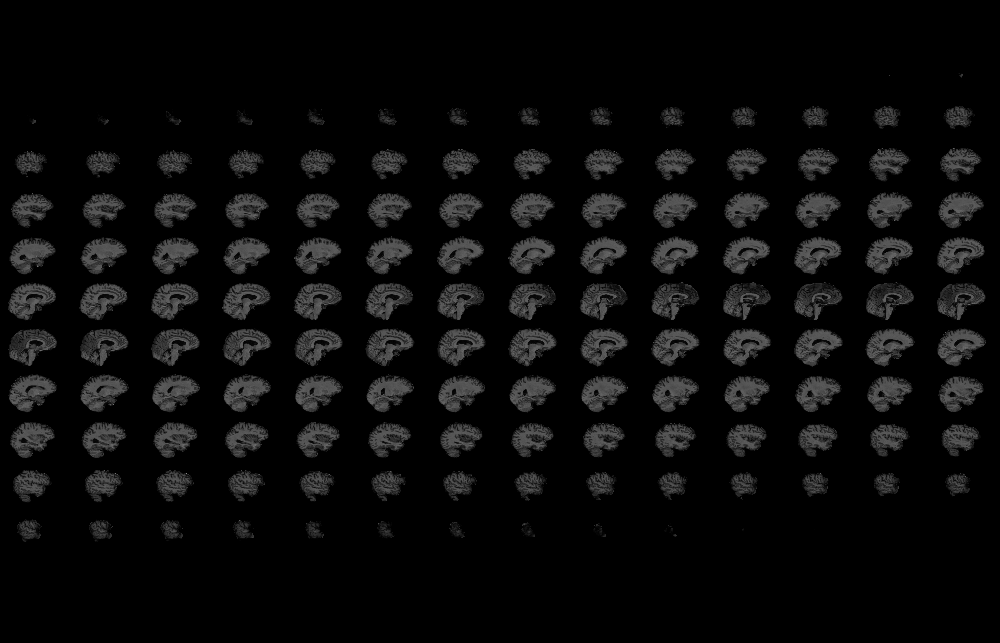
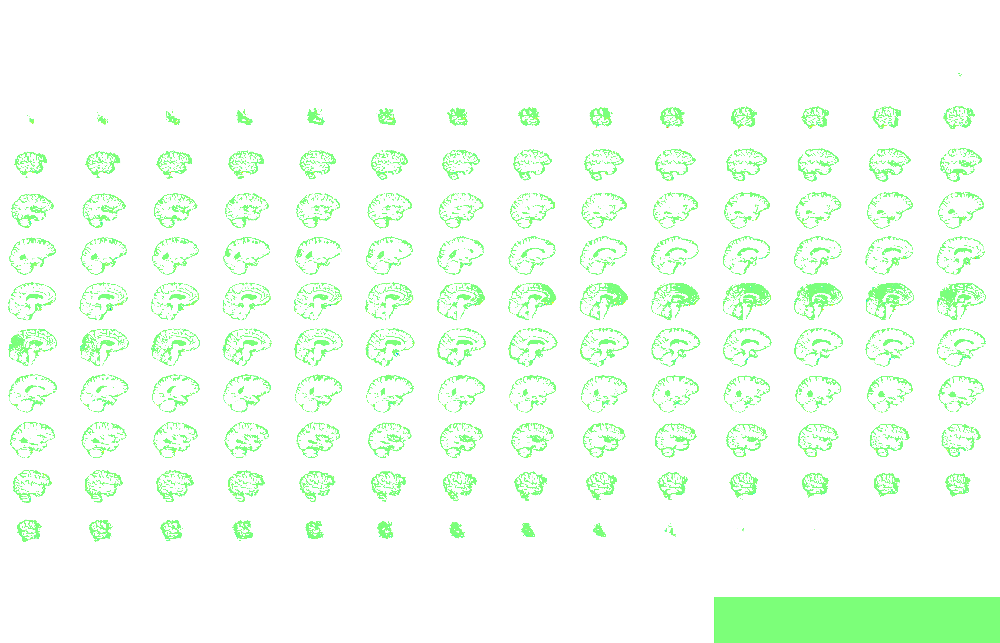

In [85]:
finite_mask = np.isfinite(beta)
beta_sum = np.where(finite_mask, beta, 0.0).sum(axis=1)
counts = finite_mask.sum(axis=1)

non_outlier_voxel_mask = np.logical_and(~outlier_voxel_mask, counts > 0)
beta_values = np.zeros(beta_mean.shape, dtype=np.float32)
beta_values[non_outlier_voxel_mask] = beta_mean[non_outlier_voxel_mask].astype(np.float32)

beta_volume = np.zeros(mask.shape, dtype=np.float32)
beta_volume[mask] = beta_values

beta_img = nib.Nifti1Image(beta_volume, bold_img.affine, bold_img.header)
beta_img = resample_to_img(beta_img, anat_img, interpolation="linear")

plt.figure()
plt.hist(beta_mean[non_outlier_voxel_mask], color='blue', alpha=0.7)
plt.title('Histogram of Mean Beta Values Across non-outliers Voxels')
plt.xlabel('Mean Beta Value')
plt.ylabel('count')
plt.show()

view = plotting.view_img(
        beta_img,
        bg_img=anat_img,
        cmap="jet",
        colorbar=True,
        title=(f"Beta mean (non-outliers)"))
view

In [48]:
outlier_mask.shape

(611414, 90)

In [31]:
np.unique(outlier_coords[0])

array([    99,    105,    106, ..., 611226, 611400, 611403],
      shape=(10994,))

In [10]:
# #If you want to check outlier voxels
# mask = np.where(abs(beta)>=1000)
# coords = np.column_stack(mask[:3])
# unique_coords = np.unique(coords, axis=0)

# dots_map = np.zeros(beta.shape[:3], dtype=np.float32)
# dots_map[tuple(unique_coords.T)] = 1.0

# voxels_img = nib.Nifti1Image(dots_map, bold_img.affine, bold_img.header)
# voxels_img = resample_to_img(voxels_img, anat_img, interpolation='nearest')

# view = plotting.view_img(voxels_img, bg_img=anat_img, cmap='autumn')
# view.save_as_html(f"voxels_with_abs(beta)_higher_1000.html")

/tmp/ipykernel_344018/2728685375.py:9: FutureWarning: 'force_resample' will be set to 'True' by default in Nilearn 0.13.0.
Use 'force_resample=True' to suppress this warning.
  voxels_img = resample_to_img(voxels_img, anat_img, interpolation='nearest')
/tmp/ipykernel_344018/2728685375.py:9: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  voxels_img = resample_to_img(voxels_img, anat_img, interpolation='nearest')
/home/zkavian/thesis_code_git/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_344018/2728685375.py:11: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to une

In [ ]:
beta = np.asarray(beta, dtype=float)  
q = 0.90
med = np.nanmedian(beta, axis=-1)                        
mad = stats.median_abs_deviation(beta, axis=-1, nan_policy='omit')  
s_v = np.maximum(1.4826 * mad, 1e-8)

z = (beta - med[..., None]) / s_v[..., None]           
tau = np.nanquantile(np.abs(z), q, axis=-1)           
z_clip = np.clip(z, -tau[..., None], tau[..., None])
beta_cleaned = med[..., None] + s_v[..., None] * z_clip   

inlier_mask = (np.nanmax(np.abs(beta_cleaned), axis=-1) <= 20)  
mask_to_plot = inlier_mask
beta_cleaned2 = np.full_like(beta_cleaned, np.nan, dtype=float)
beta_cleaned2[mask_to_plot] = beta_cleaned[mask_to_plot]
beta_cleaned = beta_cleaned2
